## Vaccination on a network

An agent based simulation to study the impact of rates of vaccination on morbidity and mortality. We use a small world network as the system to simulation COVID19 vaccination effort.

In [31]:
import agentpy as ap
import networkx as nx
import random
from scipy.stats import bernoulli

# Visualization
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import IPython


class Person(ap.Agent):

  def setup(self):
    self.condition = 0
    

  def being_sick(self):
    """
    Being able to transfer disease to peers
    """
    
    for n in self.neighbors():
      if self.condition != 3 and self.condition !=4 : # if not vaccinated or there is a chance of transmitting  c19
        if self.condition == 1:
          if n.condition!=3 and self.p.infection_chance > random.random():  #cannot get disease if vaccinated
            n.condition = 1                                                 # thats where  the self infects a neighbor who is not vaccinated

    #  determine death or recovery for the self:
    if self.condition == 1 and self.p.recovery_chance > random.random():
          self.condition = 2
    else: 
      if self.condition ==1 and self.p.death_chance > random.random():
        self.die()


      
  
  def get_vaccinated(self):
    '''
    A step to get vaccinated (state = 3)
    '''
    if self.condition == 0 and self.p.vax_chance > random.random(): # only vaccinate the health with no history of c19
      self.condition = 3
  
  def die(self):
    '''
    a note that dies given they are ill (condition = 4)
    '''
    self.condition = 4


  

In [32]:


class VirusModel(ap.Model):

  def setup(self):
    """
    Initialize the agents and netowkrs of model
    """
    #self.p.population = p.population
    self.graph = nx.watts_strogatz_graph(self.p.population,
                                    self.p.number_of_neighbors,
                                    self.p.network_randomness
    )

    #create agents and Network
    self.add_agents(self.p.population,Person)
    self.add_network(graph = self.graph, agents = self.agents)
    #
    # Infect a random share of the population
    I0 = int(self.p.initial_infections * self.p.population)
    self.agents.random(I0).condition = 1


  def update(self):
      """ Records variables after setup and each step. """
      # Record share of agents with each condition
      for i, c in enumerate(('S', 'I', 'R','V','D')):
          self[c] = (len(self.agents.select(self.agents.condition == i))
                      / self.p.population)
          self.record(c)

      # Stop simulation if disease is gone
      if self.I == 0 or self.t >self.p.steps:
          self.stop()

  def step(self):
        """ Defines the models' events per simulation step. """
        # Call 'being_sick' for infected agents
        self.agents(self.agents.condition==1).being_sick()
        # call 'get_vaccinated' only for healthy agents
        self.agents(self.agents.condition == 0).get_vaccinated()

  def end(self):
      """ Records evaluation measures at the end of the simulation. """
      # Record final evaluation measures
      self.measure('Total share infected', self.I + self.R)
      self.measure('Peak share infected', max(self.log['I']))
      self.measure('Share of vaccinated',self.V)
      self.measure('Mortality Rate', self.D)


In [35]:
parameters = {
    'population': 3000,
    'vax_chance':0.01,
    'death_chance':0.01,
    'infection_chance': 0.8,
    'recovery_chance': 0.05,
    'initial_infections': 0.1,
    'number_of_neighbors': 3,
    'network_randomness': 0.5,
    'steps':300
}

model = VirusModel(parameters)
results = model.run()
print(results.measures)

Completed: 300 steps
Run time: 0:00:06.812267
Simulation finished
   Total share infected  Peak share infected  Share of vaccinated  \
0              0.922667             0.911333                0.071   

   Mortality Rate  
0           0.004  


In [37]:
parameters = {
    'population': 3000,
    'vax_chance':0.1,
    'death_chance':0.01,
    'infection_chance': 0.9,
    'recovery_chance': 0.05,
    'initial_infections': 0.1,
    'number_of_neighbors': 3,
    'network_randomness': 0.5,
    'steps':300
}

model = VirusModel(parameters)
results = model.run()
print(results.measures)

Completed: 300 steps
Run time: 0:00:05.150457
Simulation finished
   Total share infected  Peak share infected  Share of vaccinated  \
0              0.628333                0.624             0.368667   

   Mortality Rate  
0           0.003  


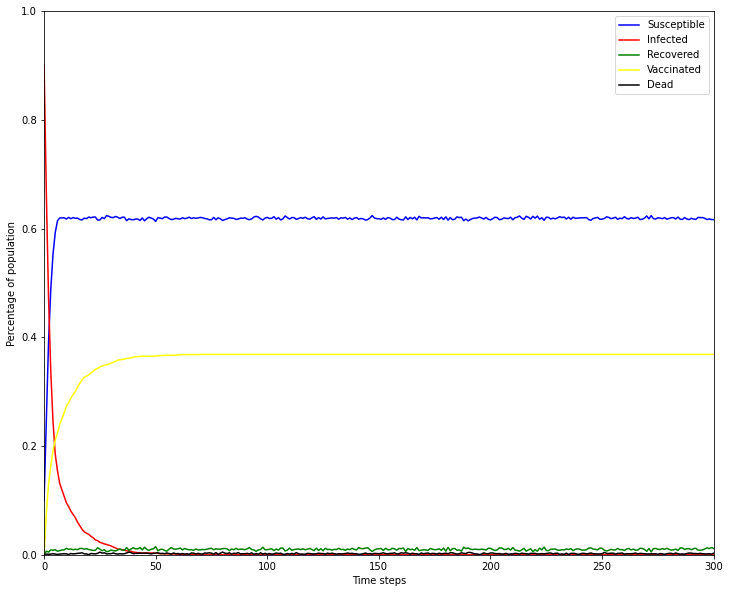

In [38]:

def virus_stackplot(data, ax):
    """ Stackplot of people's condition over time. """
    x = data.index.get_level_values('t')
    y = [data[var] for var in ['I', 'S', 'R','V','D']]
    color_dict = {0:'b', 1:'r', 2:'g',3:'yellow',4:'black'}
    # sns.set()
    # ax.stackplot(x, y, labels=['Infected', 'Susceptible', 'Recovered','Vaccinated','Dead'],
    #             colors = ['r', 'b', 'g','yellow','black'])
    for i in range(5): 
        ax.plot(x, y[i],color = color_dict[i])
    #data.plot(kind = 'line',color = ['r', 'b', 'g','yellow','black'], ax = ax)                

    ax.legend(['Susceptible','Infected',  'Recovered','Vaccinated','Dead'])
    ax.grid(False)
    ax.set_xlim(0, max(1, len(x)-1))
    ax.set_ylim(0, 1)
    ax.set_xlabel("Time steps")
    ax.set_ylabel("Percentage of population")

fig, ax = plt.subplots(1,1, figsize = (12,10))
virus_stackplot(results.variables, ax)
plt.show()



In [41]:

def animation_plot(m, axs):
    ax1, ax2 = axs
    ax1.set_title("Virus spread")
    ax2.set_title(f"Share infected: {m.I}")

    # Plot# stackplot on first axis
    virus_stackplot(m.output.variables, ax1)

    #Plot network on second axis
    
    color_dict = {0:'blue', 1:'red', 2:'green',3:'yellow',4:'black'}
    colors = [color_dict[c] for c in m.agents.condition]
    nx.draw_circular(m.env.graph, node_color=colors,
                     node_size=50, ax=ax2)
    

fig, axs = plt.subplots(1, 2, figsize=(10, 10)) # Prepare figure
parameters['population'] = 50 # Lower population for better visibility
animation = ap.animate(VirusModel(parameters), fig, axs, animation_plot)
#animation.save('basic_animation.mp4', fps=10, extra_args=['-vcodec', 'libx264'])


IPython.display.HTML(animation.to_jshtml())